In [1]:
import os
import time
import sys
import librosa as lr
import librosa.display as lrd
import numpy as np

import matplotlib.pyplot as plt
import IPython.display as ipd
from sklearn.metrics import mean_squared_error

%matplotlib inline

In [2]:
# Noise files
noisefolder = ['TCAR','TBUS','TMETRO','OOFFICE','OHALLWAY','OMEETING','DLIVING','DKITCHEN','DWASHING',\
               'NFIELD','NPARK','NRIVER', 'PCAFETER','PRESTO','PSTATION','SCAFE','SPSQUARE','STRAFFIC']
sr = 16000
win_size = np.int(0.256 * sr)
hop_size_p = 0.5 # proportion
hop_size = np.int(hop_size_p*win_size)
print(win_size, hop_size)

4096 2048


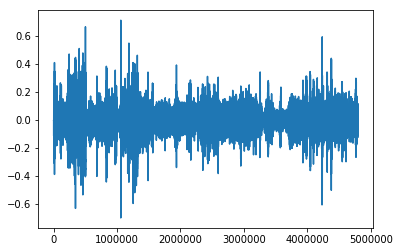

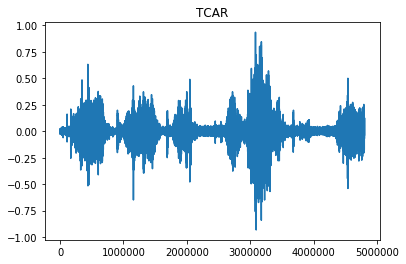

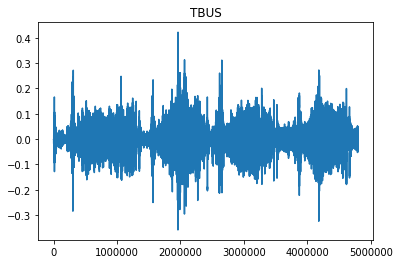

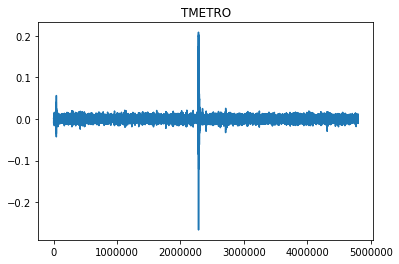

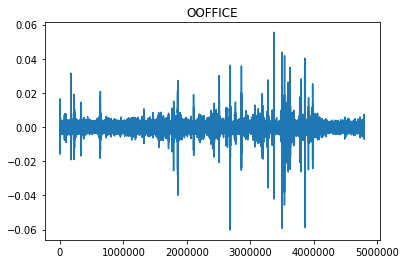

...

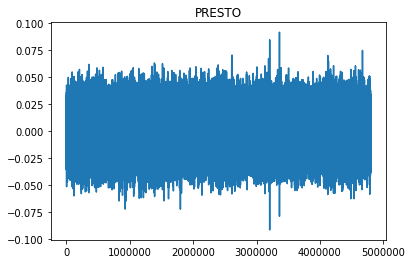

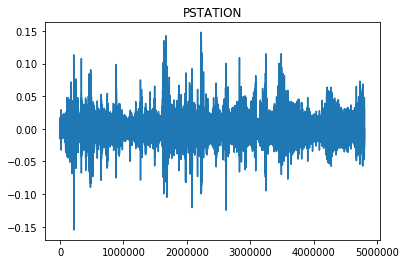

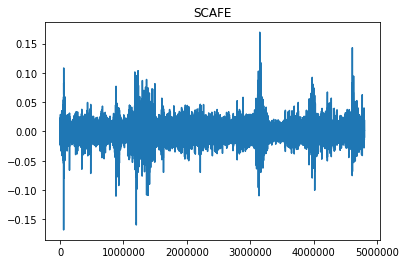

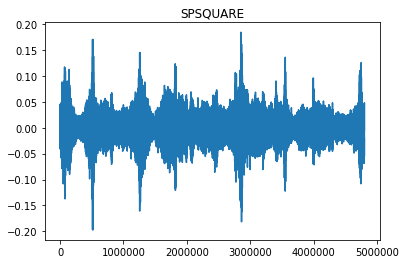

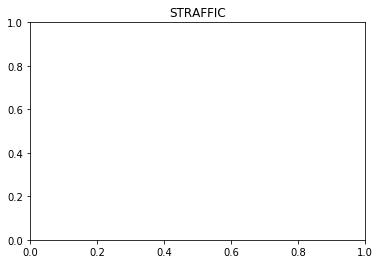

In [3]:
### Plot the wav files
for n in range(len(noisefolder)):
    noisefile = '/data/riccardo_datasets/demand/'+noisefolder[n]+'/ch01.wav'
    x, _ = lr.load(noisefile, sr)
    plt.plot(x), plt.show(), plt.title(noisefolder[n])
#     print(noisefile)


In [4]:
### Listen to a particular audio file
n = 16
print(noisefolder[n])
noisefile = '/data/riccardo_datasets/demand/'+noisefolder[n]+'/ch01.wav'
x, _ = lr.load(noisefile, sr)
ipd.Audio(x, rate=sr)

SPSQUARE


n_frag: 2342


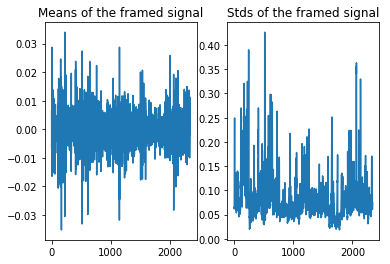

n_frag: 2342


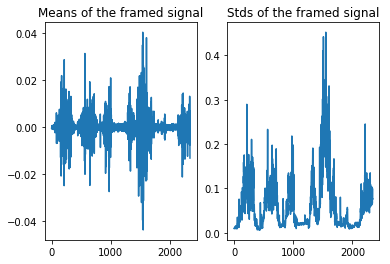

n_frag: 2342


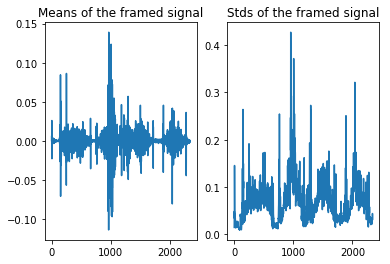

n_frag: 2342


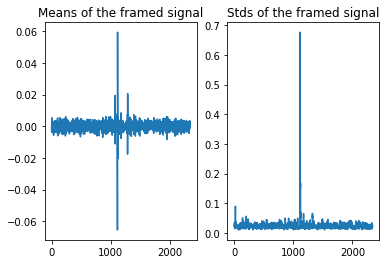

n_frag: 2342


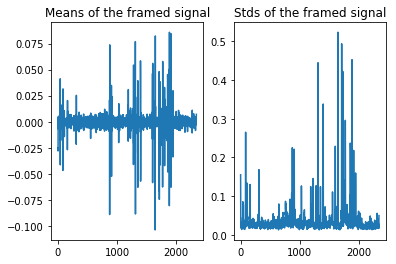

n_frag: 2342


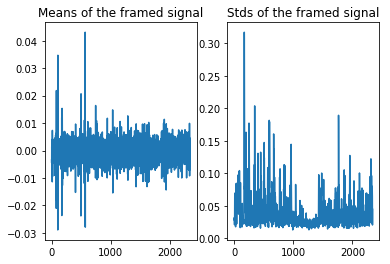

n_frag: 2342


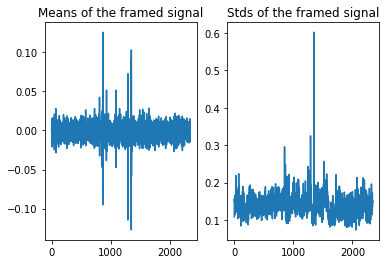

n_frag: 2342


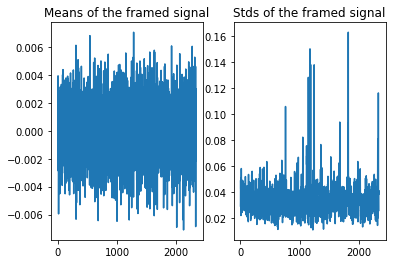

n_frag: 2342


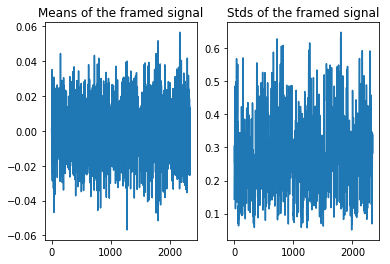

n_frag: 2342


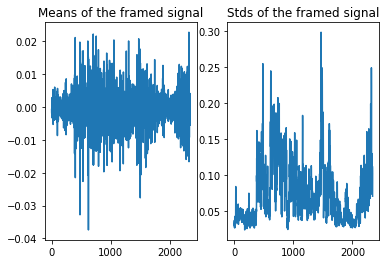

n_frag: 2342


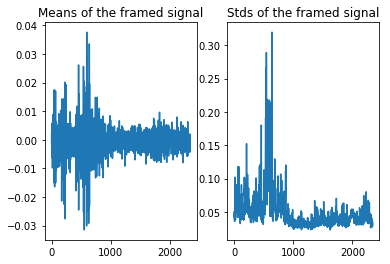

n_frag: 2342


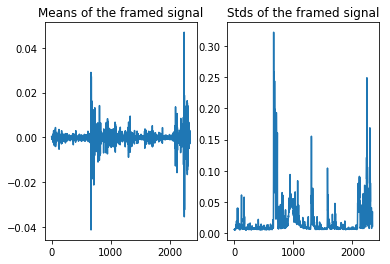

n_frag: 2342


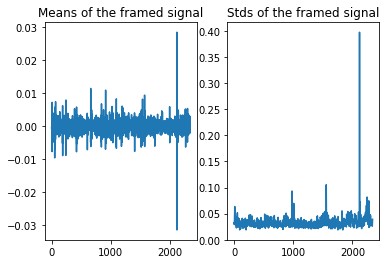

n_frag: 2342


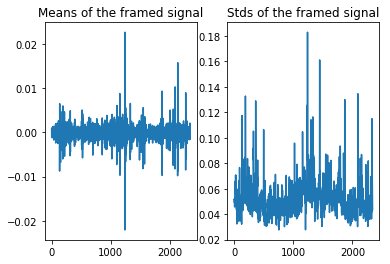

n_frag: 2342


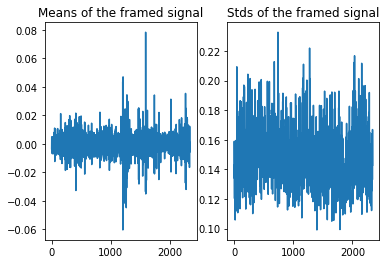

n_frag: 2342


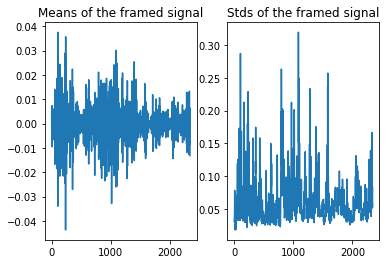

n_frag: 2342


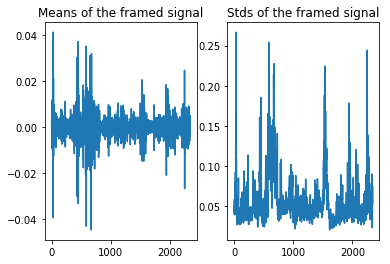

n_frag: 2342


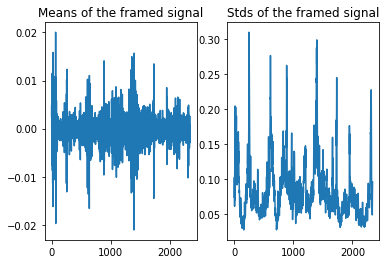

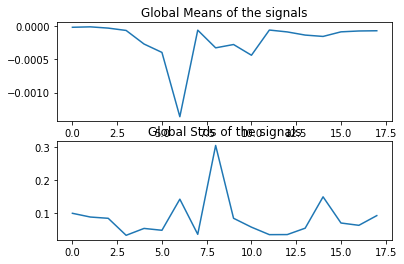

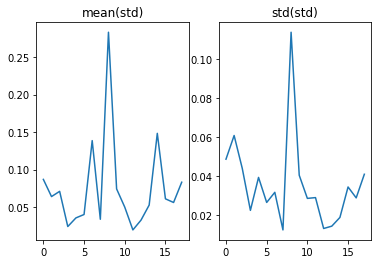

In [5]:
### Calculate statistics on the amplitude of the speech signals
maxes = np.zeros((len(noisefolder)))
mean_g = np.zeros((len(noisefolder)))
std_g = np.zeros((len(noisefolder)))
std_l_mean = np.zeros((len(noisefolder)))
std_l_std = np.zeros((len(noisefolder)))

for n in range(len(noisefolder)): #1):#
    noisefile = '/data/riccardo_datasets/demand/'+noisefolder[n]+'/ch01.wav'
    y, _ = lr.load(noisefile, sr)
    maxes[n] = np.max(y)
    x = y/maxes[n]

    # Calculate statistics of the signal
    mean_g[n] = x.mean()
    std_g[n] = x.std()
    #print(mean_g[n], std_g[n])

    n_frag = 1 + np.int((len(x)-win_size)/hop_size)
    print('n_frag: {}'.format(n_frag))
    
    mean_l = np.zeros((n_frag))
    std_l = np.zeros((n_frag))
    
    ind = 0
    for f in range(n_frag):
        #print(ind)
        # Calculate statistics on frames of the signal
        mean_l[f] = x[ind: ind+win_size].mean()
        std_l[f] = x[ind: ind+win_size].std()
        ind += hop_size

    plt.subplot(1,2,1), plt.plot(mean_l), plt.title('Means of the framed signal')
    plt.subplot(1,2,2), plt.plot(std_l), plt.title('Stds of the framed signal')
    plt.show()
    
    # Calculate statistics on the variance of the signal
    std_l_mean[n] = std_l.mean()
    std_l_std[n] = std_l.std()
#     print('mean(std): {}, std(std): {}'.format( std_l_mean[n], std_l_std[n]))
    
    
plt.subplot(2,1,1), plt.plot(mean_g), plt.title('Global Means of the signals')
plt.subplot(2,1,2),plt.plot(std_g), plt.title('Global Stds of the signals')
plt.show()

plt.subplot(1,2,1), plt.plot(std_l_mean), plt.title('mean(std)')
plt.subplot(1,2,2), plt.plot(std_l_std), plt.title('std(std)')
plt.show()

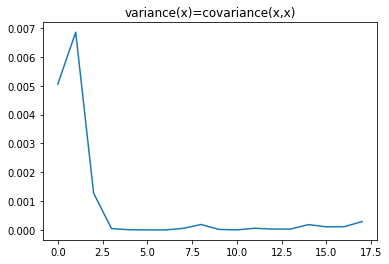

([<matplotlib.lines.Line2D at 0x7fefd22b0cc0>],
 Text(0.5, 1.0, 'variance(x)=covariance(x,x)'),
 None)

In [6]:
### COVARIANCE ANALYSIS
covs = np.zeros((len(noisefolder)))
for n in range(len(noisefolder)): #1):#
    noisefile = '/data/riccardo_datasets/demand/'+noisefolder[n]+'/ch01.wav'
    y, _ = lr.load(noisefile, sr)
    covs[n] = np.cov(y)
plt.plot(covs), plt.title('variance(x)=covariance(x,x)'), plt.show(), 

In [7]:
### Analysis of central gravity centers

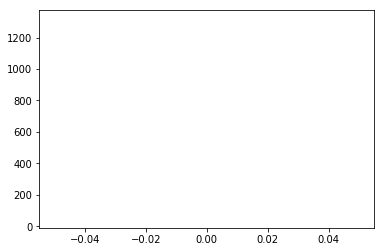

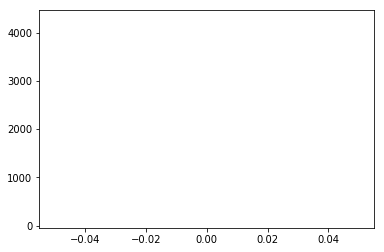

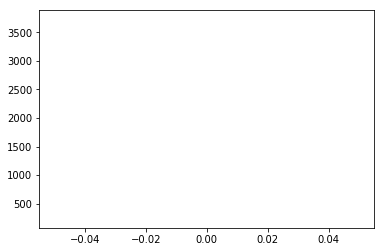

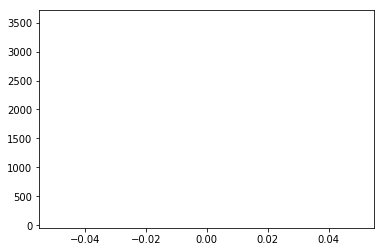

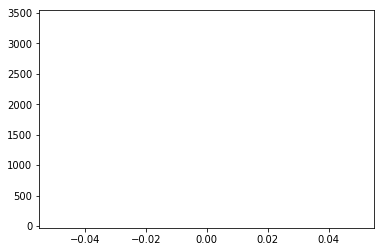

...

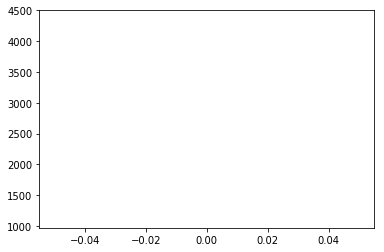

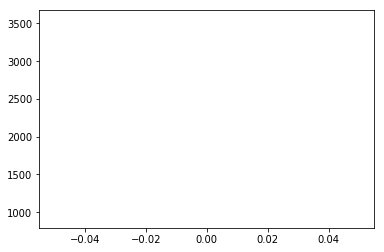

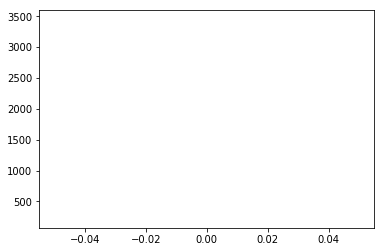

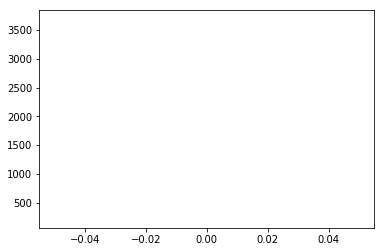

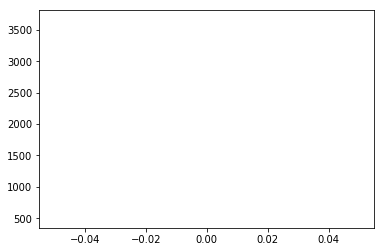

In [9]:
for n in range(1):#len(noisefolder)): #
    noisefile = '/data/riccardo_datasets/demand/'+noisefolder[n]+'/ch01.wav'
    y, _ = lr.load(noisefile, sr)
    if_gram, D = librosa.ifgram(y)
    lr.feature.spectral_centroid(y, sr, , freq=if_gram)
    plt.figure()
    plt.subplot(2, 1, 1)
    plt.semilogy(cent.T, label='Spectral centroid')
    plt.ylabel('Hz')
    plt.xticks([])
    plt.xlim([0, cent.shape[-1]])
    plt.legend()
    plt.subplot(2, 1, 2)
    librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max),y_axis='log', x_axis='time')
    plt.title('log Power spectrogram')
    plt.tight_layout()
    
    